# **<center>Classification With Localization: Convert any keras Classifier to a Detector</center>**




---



---



**Here’s our Outline for the complete Pipeline:**

- **Step 1: Download the Dataset**
- **Step 2: Perform the Data Augmentation**
- **Step 3: Preprocess the Dataset**
- **Step 4: Visualize the Data with its Annotations**
- **Step 5: Split the Data into Train and Validation Set**
- **Step 6: Construct the Multi Output Model**
- **Step 7: Compile & Train the Model**
- **Step 8: Plot Model’s Loss & Accuracy Curves**
- **Step 9: Test your model on New Images**



Make sure you have imgaug library installed.

In [ ]:
!pip install imgaug

#### **Import Required Libraries:**
Start by importing all required libraries.

In [ ]:
import tensorflow as tf
import numpy as np
tf.random.set_seed(100)

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Activation, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import  EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import Sequence, plot_model, to_categorical
from tensorflow.keras.layers import Dropout
from tensorflow.keras import backend as K 

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import cv2
import random
import os
import glob

import urllib
import tarfile
from zipfile import ZipFile
import scipy.io
from PIL import Image, ImageDraw, ImageEnhance

import imgaug as ia
ia.seed(1)

%matplotlib inline
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
from imgaug import augmenters as iaa 


import imageio
import pandas as pd
import numpy as np
import re

import shutil

## **Step 1: Download the Dataset**

Let’s start by downloading the dataset, we’ve actually extracted a subset of [CALTECH-101 dataset](http://www.vision.caltech.edu/Image_Datasets/Caltech101/) and created a dataset which contains images for only 3 classes, namely `elephant`, `butterfly` and `cougar-face`. The class labels and bounding box coordinates for each image is present in .MAT (Matlab) format.

Here is the link to the original dataset with all its classes: 

After downloading the data, you will need to extract it.


In [ ]:
# Download the dataset
!wget -O CALTECH.zip https://zenodo.org/record/4126613/files/CALTECH.zip?download=1

# Extract all the contents of zip file in current directory
with ZipFile('CALTECH.zip', 'r') as zipObj:
   zipObj.extractall()

--2020-11-02 16:34:15--  https://zenodo.org/record/4126613/files/CALTECH.zip?download=1
Resolving zenodo.org (zenodo.org)... 137.138.76.77
Connecting to zenodo.org (zenodo.org)|137.138.76.77|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3808782 (3.6M) [application/octet-stream]
Saving to: ‘CALTECH.zip’

CALTECH.zip         100%[===================>]   3.63M  --.-KB/s    in 0.1s    

2020-11-02 16:34:16 (26.3 MB/s) - ‘CALTECH.zip’ saved [3808782/3808782]



## **Step 2: Perform Data Augmentation**

Data Augmentation is a very useful technique to expand a dataset and make a model generalize better. 

There are many types of augmentations we can perform on Images. Normally when you're deaing with an image classification problem, you can do agumentation with the keras built-in `tf.keras.preprocessing.image.ImageDataGenerator`.

Unfortunately we can't use the ImageDataGenerator in this notebook!

**Why not?**

We'll because in augmentation we employ techniques like shift, rotation, shear, crop, zoom etc. All these techniques will fundamentally change the image but when the images changes the corresponding bounding box coordinates should also change and since keras augmentation function only modifies the image and not the box coordinates so it's a really bad idea to use the default augmentation function.

So what can we do?

*Well, we have 3 options.* 

1. **Use the keras defualt augmentation module but use agumentations that do not change the image spatially. e.g. centering, normalization, whitening etc.**

2. **Create our own custom augmentation functions that modify the images as well as the bounding boxes.**

3. **Use a library like imgaug, which allows you to augment images and bounding box locations.**

So which one should we use?

Option 1 is by far the least effective since if you're not spatially modifying the image then you don't have many options.

If you go with Option 2 then you would need to write a lot of boiler plate code and there can be bugs.

For this notebook I went with option 3, which is the most effective option. [**imgaug library**](https://github.com/aleju/imgaug)  will allow us to do a number of augmentations and Yes those will also be applied to the bounding boxes.

With imgaug we will apply 7 different type of augmentations to our dataset:

* Rescaling the image
* Rotating the image
* Shifting the image 
* Fliping the image
* Changing the brightness 
* Blurring to the image
* Adding Noise to the image

You can look at imgaug docs [here.](https://imgaug.readthedocs.io/en/latest/source/examples_basics.html)

The code we write will randomly use any 3 of these augmentations on each image

The data augmentation scheme performed here is a modified version of the one by **Asset Karazhay** from this [post.]( https://medium.com/@a.karazhay/guide-augment-images-and-multiple-bounding-boxes-for-deep-learning-in-4-steps-with-the-notebook-9b263e414dac) 


### **Convert MAT Labels into CSV**
To perform data augmenation we first have to convert our labels into a CSV format so that the imgaug library can easily use the labels to augment the images as well as their bounding boxes

#### **Function to Extract MAT attributes:**
The CALTECH-101 dataset comes in the form of MATLAB files, since we’ll be modifying our classifier to do detection we need the annotations in a more familiar format. So what we’ll do is create a function to extract the class label and the bounding box coordinates (x1, y1, x2, y2) from each MAT File. We’ll also extract the name of the image so we can associate each MAT file with its correct image.






In [ ]:
def extract_mat_contents(annot_directory, image_dir):
        
        # Create MAT Parser
        mat = scipy.io.loadmat(annot_directory)

        # Get the height and width for our image
        height, width = cv2.imread(image_dir).shape[:2]

        # Get the bounding box co-ordinates
        x1, y2, y1, x2 = tuple(map(tuple, mat['box_coord']))[0]

        # We Split the image Directory passed in the method and choose the index
        # Of the Folders name which is the same as it's class
        class_name = image_dir.split('/')[2]

        filename = '/'.join(image_dir.split('/')[-2:])

        # Return the extracted attributes
        return filename,  width, height, class_name, x1,y1,x2,y2

The function above will be used in the function below to go through the image and annotation directories and extract their information such as 
* Height
* Width
* Bounding box coordinates
* Class

Then this information will be stored in a pandas dataframe so we can use it with imgaug to perform augmentations.

In [ ]:
# Function to convert MAT files to CSV
def mat_to_csv(annot_directory, image_directory, classes_folders):

  # List containing all our attributes regarding each image
  mat_list = []

  # We loop our each class and its labels one by one to preprocess and augment 
  for class_folder in classes_folders:

    # Set our images and annotations directory
    image_dir = os.path.join(image_directory, class_folder)
    annot_dir = os.path.join(annot_directory, class_folder) 

    # Get each file in the image and annotation directory
    mat_files = sorted(os.listdir(annot_dir))
    img_files = sorted(os.listdir(image_dir))

    # Loop over each of the image and its label
    for mat, image_file in zip(mat_files, img_files):
      
      # Full mat path
      mat_path = os.path.join(annot_dir, mat)

      # Full path Image
      img_path = os.path.join(image_dir, image_file)

      # Get Attributes for each image 
      value = extract_mat_contents(mat_path, img_path)

      # Append the attributes to the mat_list
      mat_list.append(value)

  # Columns for Pandas DataFrame
  column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 
                 'xmax', 'ymax']

  # Create the DataFrame from mat_list
  mat_df = pd.DataFrame(mat_list, columns=column_name)

  # Return the dataframe
  return mat_df

# The Classes we will use for our training
classes_list = sorted(['butterfly',  'cougar_face', 'elephant'])


# Set our images and annotations directory
image_directory = 'CALTECH/CALTECH_Dataset'
annot_directory = 'CALTECH/CALTECH_Annotations'

# Run the function to convert all the MAT files to a Pandas DataFrame
labels_df = mat_to_csv(annot_directory, image_directory, classes_list)

# Saving the Pandas DataFrame as CSV File
labels_df.to_csv(('labels.csv'), index=None)

Now that we have the data ready in the required format we can proceed to perform the augmentations

**Here we're creating a helper function that will convert imagaug's bounding box objects to panda's dataframe.**

In [ ]:
# Function to convert bounding box image into DataFrame 
def bounding_boxes_to_df(bounding_boxes_object):

    # Convert Bounding Boxes Object to Array
    bounding_boxes_array = bounding_boxes_object.to_xyxy_array()
    
    # Convert the array into DataFrame
    df_bounding_boxes = pd.DataFrame(bounding_boxes_array, 
                                     columns=['xmin', 'ymin', 'xmax', 'ymax'])
    
    # Return the DataFrame
    return df_bounding_boxes

### **Initialize the Augmentations**
Initialize the imgaug library with the augmentations we are going to use with the images. imgaug select `n` random augmentations from the list below and apply an image. For every image a new random combination of augmentation is used. You can set this value of `n` below, I'm setting it to 2.

In [ ]:
# Define all the Augmentations you want to apply to your dataset
# We're setting random `n` agumentations to 2. 
image_augmentations = iaa.SomeOf( 2,
    [                                 
    # Scale the Images
    iaa.Affine(scale=(0.5, 1.5)),

    # Rotate the Images
    iaa.Affine(rotate=(-60, 60)),

    # Shift the Image
    iaa.Affine(translate_percent={"x":(-0.3, 0.3),"y":(-0.3, 0.3)}),

    # Flip the Image
    iaa.Fliplr(1),

    # Increase or decrease the brightness
    iaa.Multiply((0.5, 1.5)),

    # Add Gaussian Blur
    iaa.GaussianBlur(sigma=(1.0, 3.0)),
    
    # Add Gaussian Noise
    iaa.AdditiveGaussianNoise(scale=(0.03*255, 0.05*255))

])

As you can see we're not only adding different types of augmentations but also setting some range for each type of augmentation. You can change these values, for more information on augmentation options in `imgaug` look [here.](https://imgaug.readthedocs.io/en/latest/source/overview_of_augmenters.html)

### **Create a Function to Apply Augmentations**

This function will finally perform the image augmentations to both images and bounding boxes. It will read the labels dataframe we created earlier to get the bounding box information for each image and as it augments it, and then will also edit the bounding box coordinates so that the coordinates remain true even after augmentation is done.

In [ ]:
def image_aug(df, images_path, aug_images_path, augmentor, multiple = 3):
    
    # Fill this DataFrame with image attributes
    augmentations_df = pd.DataFrame(
        columns=['filename','width','height','class', 'xmin', 'ymin', 'xmax',
                 'ymax'])
    
    # Group the data by filenames
    grouped_df = df.groupby('filename')

    # Create the directory for all augmentated images
    if not os.path.exists(aug_images_path):
      os.mkdir(aug_images_path)

    # Create directories for each class of augmentated images
    for folder in df['class'].unique():
      if not os.path.exists(os.path.join(aug_images_path, folder)):
        os.mkdir(os.path.join(aug_images_path, folder))

    for i in range(multiple):
      
      # Post Fix we add to the each different augmentation of one image
      image_postfix = str(i)

      # Loop to perform the augmentations
      for filename in df['filename'].unique():

        augmented_path = os.path.join(aug_images_path, filename)+image_postfix+'.jpg'

        # Take one image at a time with its information
        single_image = grouped_df.get_group(filename)
        single_image = single_image.reset_index()
        single_image = single_image.drop(['index'], axis=1)   
        
        # Read the image
        image = imageio.imread(os.path.join(images_path, filename))

        # Get bounding box
        bounding_box_array = single_image.drop(['filename', 'width', 'height',
                                                'class'], axis=1).values

        # Give the bounding box to imgaug library
        bounding_box = BoundingBoxesOnImage.from_xyxy_array(bounding_box_array, 
                                                            shape=image.shape)

        # Perform random 2 Augmentations
        image_aug, bounding_box_aug = augmentor(image=image, 
                                                bounding_boxes=bounding_box)
        
        # Discard the the bounding box going out the image completely   
        bounding_box_aug = bounding_box_aug.remove_out_of_image()

        # Clip the bounding box that are only partially out of th image
        bounding_box_aug = bounding_box_aug.clip_out_of_image()

        # Get rid of the the image if bounding box was discarded  
        if re.findall('Image...', str(bounding_box_aug)) == ['Image([]']:
            pass
        
        else:
        
          # Create the augmented image file
          imageio.imwrite(augmented_path, image_aug) 

          # Update the image width and height after augmentation
          info_df = single_image.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)    
          for index, _ in info_df.iterrows():
              info_df.at[index, 'width'] = image_aug.shape[1]
              info_df.at[index, 'height'] = image_aug.shape[0]

          # Add the prefix to each image to differentiate if required
          info_df['filename'] = info_df['filename'].apply(lambda x: x + image_postfix + '.jpg')

          # Create the augmented bounding boxes dataframe 
          bounding_box_df = bounding_boxes_to_df(bounding_box_aug)

          # Concatenate the filenames, height, width and bounding boxes 
          aug_df = pd.concat([info_df, bounding_box_df], axis=1)

          # Add all the information to augmentations_df we initialized above
          augmentations_df = pd.concat([augmentations_df, aug_df])            
      
    # Remove index
    augmentations_df = augmentations_df.reset_index()
    augmentations_df = augmentations_df.drop(['index'], axis=1)

    # Return the Dataframe
    return augmentations_df


augmented_images_df = image_aug(labels_df, image_directory, 'aug_images', 
                                image_augmentations)

Apply the function above to do augmentation

In [ ]:
augmented_images_df = augmented_images_df.sort_values('filename', ignore_index= True)
augmented_images_df.to_csv('aug.csv')

# Check Dataset Size
print('Our total dataset Size before the augmentations was: ', len(labels_df))
print('Our total dataset Size after the augmentations is: ', len(augmented_images_df))

Our total dataset Size before the augmentations was:  218
Our total dataset Size after the augmentations is:  654


## **Step 3: Preprocess the Dataset**
Now we will start converting class labels to one hot encoded vectors and the bounding boxes will be scaled to range 0-1 because it’s easier for the network to predict values in a fixed range for each image, plus we will be using the sigmoid activation function for the localization / regression head, and sigmoid outputs values between 0-1.

We will also preprocess the image by resizing it to a fixed size, converting to RGB channel format and normalizing it by dividing it by 255.0. This will help the network in training.

In [ ]:
def preprocess_dataset(image_folder, classes_list, df, image_size = 300,):


  # Lists that will contain the whole dataset
  labels = []
  boxes = []
  img_list = []

  # Get height and width of each image in the datafame
  h = df['height']
  w = df['width']

  # Create a copy of the labels in the dataframe
  labels = list(df['class'])

  # Create a copy of the bounding box values and also normalize them 
  for x1, y1, x2, y2 in zip(list(df['xmin']/w), list(df['ymin']/h), 
                            list(df['xmax']/w), list(df['ymax']/h)):
    
    arr = [x1, y1, x2, y2]
    boxes.append(arr)

  # We loop over each class and its labels 
  for class_folder in classes_list:  

    # Set our images directory
    image_dir = os.path.join(image_folder, class_folder)

    # Annotation and Image files
    img_files = sorted(os.listdir(image_dir))

    # Loop over each of the image and its label
    for image_file in img_files:

      # Full path Image
      img_path = os.path.join(image_dir, image_file)

      # Read the image
      img  = cv2.imread(img_path)

      # Resize all images to a fix size
      image = cv2.resize(img, (image_size, image_size))

      # Convert the image from BGR to RGB as NasNetMobile was trained on RGB images
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

      # Normalize the image by dividing it by 255.0 
      image = image.astype("float") / 255.0

      # Append it to the list of images
      img_list.append(image)

  return labels, boxes, img_list

Now call the preprocessing function

In [ ]:
# All images will resized to 300, 300 
image_size = 300

# Get Augmented images and bounding boxes
labels, boxes, img_list = preprocess_dataset('aug_images', classes_list,
                                             augmented_images_df)

We'll Shuffle the data after preprocessing is done.

In [ ]:
# Convert labels to integers, then one hot encode them
label_encoder = LabelEncoder()
integer_labels = label_encoder.fit_transform(labels)
onehot_labels = to_categorical(integer_labels)

# Now we need to shuffle the data, so zip all lists and shuffle
combined_list = list(zip(img_list, boxes, onehot_labels))
random.shuffle(combined_list)

# Extract back the contents of each list
img_list, boxes, onehot_labels = zip(*combined_list)

print('All Done')

All Done


## **Step 4: Visualize the Data with its Annotations**
Here we will pick some random images from each class and draw its associated bounding boxes over it. This way you’ll be able to visualize the data and make sure that your preprocessing steps were done correctly.

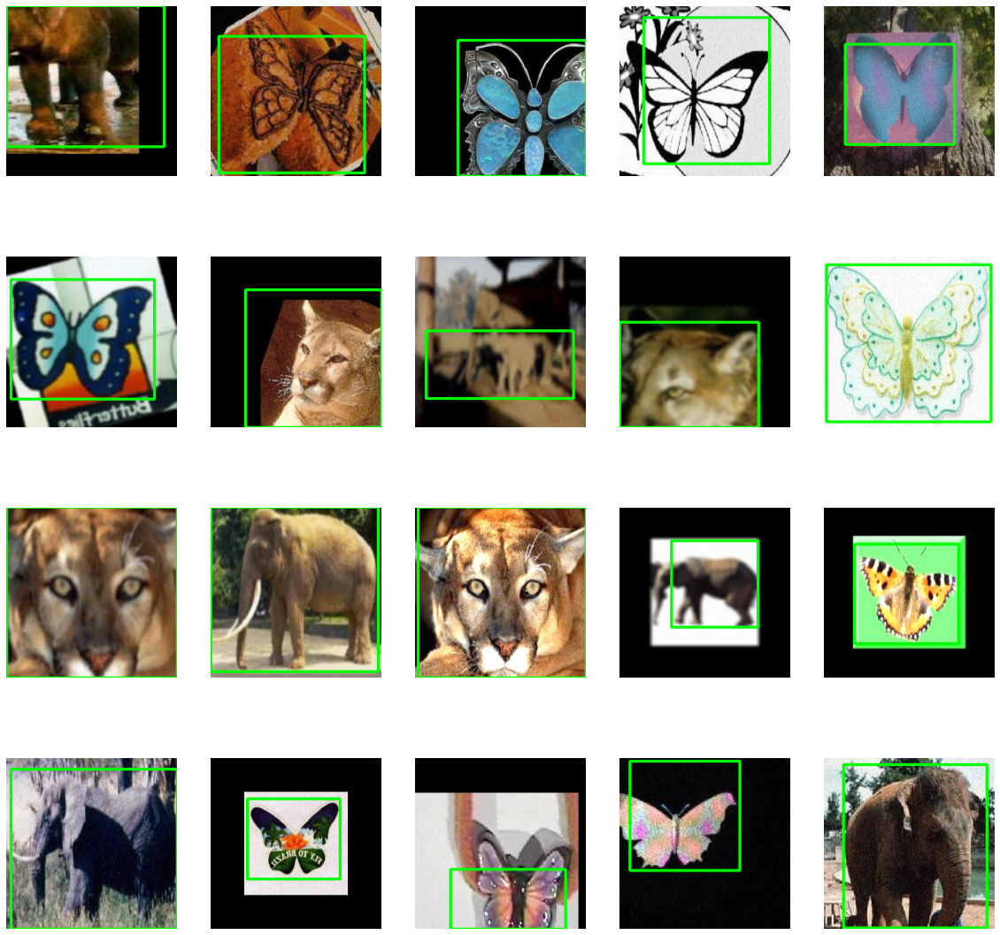

In [ ]:
# Create a Matplotlib figure
plt.figure(figsize=(20,20));

# Generate a random sample of images each time the cell is run 
random_range = random.sample(range(1, len(img_list)), 20)

for iteration, i in enumerate(random_range, 1):

    # Bounding box of each image
    a1, b1, a2, b2 = boxes[i];

    # Rescaling the boundig box values to match the image size
    x1 = a1 * image_size
    x2 = a2 * image_size
    y1 = b1 * image_size
    y2 = b2 * image_size

    # The image to visualize
    image = img_list[i]

    # Draw bounding boxes on the image
    cv2.rectangle(image, (int(x1),int(y1)),
          (int(x2),int(y2)),
                  (0,255,0),
                  3);
    
    # Clip the values to 0-1 and draw the sample of images
    image = np.clip(img_list[i], 0, 1)
    plt.subplot(4, 5, iteration);
    plt.imshow(image);
    plt.axis('off');

## **Step 5: Split the Data into Train and Validation Set**
Now we would have 3 lists, one list containing all images, the second one contains all class labels in one hot encoded format and the third one list contains scaled bounding box coordinates. Let’s split our data to create a training and validation set. It’s important that you shuffle your data before the split which we have already done.


In [ ]:
# Split the data of images, labels and their annotations
train_images, val_images, train_labels, \
val_labels, train_boxes, val_boxes = train_test_split( np.array(img_list), 
                np.array(onehot_labels), np.array(boxes), test_size = 0.1, 
                random_state = 43)

print('Total Training Images: {}, Total Validation Images: {}'.format(
    len(train_images), len(val_images) ))

Total Training Images: 588, Total Validation Images: 66


## **Step 6: Construct the Multi Output Model**
Now it’s time to create our Multi Output model. We won’t be training from scratch but we will use transfer learning. The model we’ll use is NasnetMobile. This is a really efficient model with a good balance of speed and accuracy,  It was created through Neural Architecture Research (NAS) which is an emerging field of AutoML.

We’ll first download the model but exclude the top, since we’ll be adding our own custom top


In [ ]:
# Load the NasNetMobile Model, make sure to exclude the top for transfer learning
N_mobile = tf.keras.applications.NASNetMobile( input_tensor = Input(
    shape=(image_size, image_size, 3)), 
    include_top=False, 
    weights='imagenet')

19996672/19993432 [==============================] - 1s 0us/step


In [ ]:
# Let's create a function that will construct our model
def create_model(no_of_classes):

    # Freeze the whole model
    N_mobile.trainable = False
    
    # Start by taking the output feature maps from NASNETMobile
    base_model_output = N_mobile.output
    
    # Convert to a single-dimensional vector by Global Average Pooling.

    # We could also use Flatten()(x) but GAP is more effective, it reduces 
    # Parameters and controls overfitting.
    flattened_output = GlobalAveragePooling2D()(base_model_output)

    # Create our Classification Head, final layer contains 
    # Ouput units = no. classes
    class_prediction = Dense(256, activation="relu")(flattened_output)
    class_prediction = Dense(128, activation="relu")(class_prediction )
    class_prediction = Dropout(0.2)(class_prediction)
    class_prediction = Dense(64, activation="relu")(class_prediction)
    class_prediction = Dropout(0.2)(class_prediction )
    class_prediction = Dense(32, activation="relu")(class_prediction)
    class_prediction = Dense(no_of_classes, activation='softmax',
                             name="class_output")(class_prediction)

    # Create Our Localization Head, final layer contains 4 nodes for x1,y1,x2,y2
    # Respectively.
    box_output = Dense(256, activation="relu")(flattened_output)
    box_output = Dense(128, activation="relu")(box_output)
    box_output = Dropout(0.2)(box_output )

    box_output = Dense(64, activation="relu")(box_output)
    box_output = Dropout(0.2)(box_output )

    box_output = Dense(32, activation="relu")(box_output)
    box_predictions = Dense(4, activation='sigmoid',
                            name= "box_output")(box_output)

    # Now combine the two heads
    model = Model(inputs=N_mobile.input, outputs= [box_predictions, 
                                                   class_prediction])

    return model

# Create the model for 3 classes, Elephant, Butterfly, Cougar-Face
model = create_model(3); print("Model Created")

Model Created


### **Check Model’s Structure:**
Using the plot_model function you can check the structure of the final model, this is really helpful when you’re creating a complex network and you want to make sure you have constructed the network correctly.


In [ ]:
plot_model(model, to_file='model_plot.png', show_shapes=True, 
           show_layer_names=True)

## **Step 7: Compile & Train the Model**


Now here are a couple of things that you need to do. If this was a single output model you would have just defined a loss, a metric and an optimizer and compiled the model. Since we’re dealing with a multi output model that outputs two totally different things so we need to use seperate loss and separate metrics for both of these output branches.

Remember when we were creating the model we actually assigned names to our two output branches by doing that now we can easily refer to the name of an output branch and then assign it a specific loss or metric, just like a python dictionary. 


In [ ]:
# Here for each head we will define a different loss, we will define it 
# Like a dictionary.

# For classification we will have cateogirical crossentropy
# For the bouding boxes we will have mean squared error
losses = { 
    "box_output": "mean_squared_error",
    "class_output": "categorical_crossentropy"
    }

# Here you can give more or less weightage to each loss. 

# If you think that detection is harder then the classification then you can 
# Try assinging it more weight
loss_weights = {
    "box_output": 1.0, 
    "class_output": 1.0
    }

# Set the Metrics
# For the class labels we want to know the Accuracy
# And for the bounding boxes we need to know the Mean squared error
metrics = {
    'class_output': 'accuracy', 
    'box_output':  'mse'
    }

# We will be using early stopping to stop the model if total val loss does not
# Decrease by 0.001 in 40 epochs
stop = EarlyStopping(monitor = "val_loss", min_delta = 0.0001, patience = 40, 
                    restore_best_weights = True
                     )

# Change the learning rate according to number of epochs to boost learning
reduce_lr = ReduceLROnPlateau(monitor = "val_loss", factor = 0.0002, 
                              patience = 30, min_lr = 1e-7, verbose = 1)

# Initialize Optimizer
opt = SGD(lr = 1e-3, momentum = 0.9)

# Compile the model with Adam optimizer
model.compile(optimizer = opt, loss = losses, loss_weights = loss_weights, 
    metrics = metrics)

### **Start Training:**
When you're dealing with a multi output model then you need to assingn individual branches labels seperately like a dictionary. 

In [ ]:
# Train the Model
history = model.fit(x = train_images, 
                    y= {
                        "box_output": train_boxes, 
                        "class_output": train_labels
                        }, 
                    validation_data=(
                        val_images, 
                        {
                          "box_output": val_boxes, 
                          "class_output": val_labels
                          }), batch_size = 32, epochs = 500, 
                    callbacks=[reduce_lr, stop])

Epoch 1/500
19/19 [==============================] - 5s 254ms/step - loss: 1.2420 - box_output_loss: 0.1749 - class_output_loss: 1.0671 - box_output_mse: 0.1749 - class_output_accuracy: 0.3350 - val_loss: 1.1993 - val_box_output_loss: 0.1653 - val_class_output_loss: 1.0340 - val_box_output_mse: 0.1653 - val_class_output_accuracy: 0.4091
Epoch 2/500
19/19 [==============================] - 1s 72ms/step - loss: 1.1895 - box_output_loss: 0.1661 - class_output_loss: 1.0234 - box_output_mse: 0.1661 - class_output_accuracy: 0.5068 - val_loss: 1.1308 - val_box_output_loss: 0.1555 - val_class_output_loss: 0.9753 - val_box_output_mse: 0.1555 - val_class_output_accuracy: 0.7273
Epoch 3/500
19/19 [==============================] - 1s 71ms/step - loss: 1.1330 - box_output_loss: 0.1560 - class_output_loss: 0.9771 - box_output_mse: 0.1560 - class_output_accuracy: 0.6548 - val_loss: 1.0632 - val_box_output_loss: 0.1462 - val_class_output_loss: 0.9171 - val_box_output_mse: 0.1462 - val_class_output_ac

## **Step 8: Plot Model’s Loss & Accuracy Curves**
Now we had seperate losses and sperate metrics for differnt branches, on top of that we used a validation set. We're now dealing with 10 total metrics. Let's visualize and understand these by plotting them.

In [ ]:
def plot(var1, var2, plot_name):
  # Get the loss metrics from the trained model
  c1 = history.history[var1]
  c2 = history.history[var2]

  epochs = range(len(c1))
  
  # Plot the metrics
  plt.plot(epochs, c1, 'b', label=var1)
  plt.plot(epochs, c2, 'r', label=var2)
  plt.title(str(plot_name))
  plt.legend()

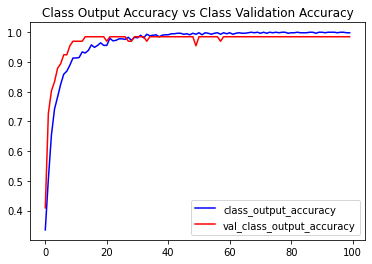

In [ ]:
plot('class_output_accuracy','val_class_output_accuracy','Class Output Accuracy vs Class Validation Accuracy')

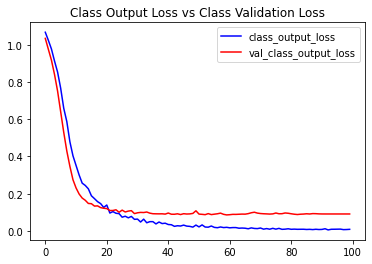

In [ ]:
plot('class_output_loss','val_class_output_loss','Class Output Loss vs Class Validation Loss')

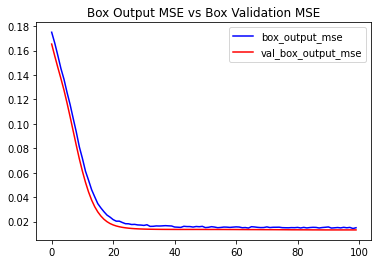

In [ ]:
plot('box_output_mse','val_box_output_mse','Box Output MSE vs Box Validation MSE')

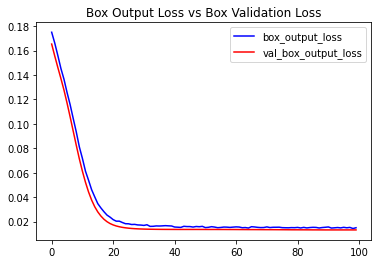

In [ ]:
plot('box_output_loss','val_box_output_loss','Box Output Loss vs Box Validation Loss')

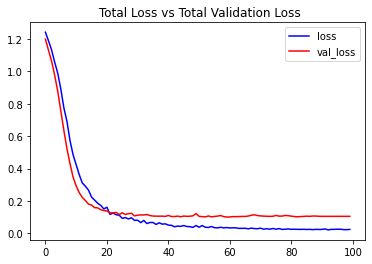

In [ ]:
# These are the most important metrics in telling us how our model is doing
plot('loss','val_loss',' Total Loss vs Total Validation Loss')

### **Save Your Model**
You should save your model for future runs.

In [ ]:
# Save your model here in .h5 format.
model.save('caltech.h5')

# Load the saved model
# model = load_model('caltech.h5')

## **Step 9: Test your model on New Images**
In this step we will create a function that will use the model to predict on new images.

In [ ]:
# Enter your class names in this list
global label_names

# Must be same as Annotations list we used to choose the data
label_names = sorted(classes_list)

### **Predict Function**
Here we will create a function that that will use the model to predict on new images.


In [ ]:
# We will use this function to make prediction on images.
def predict(image, returnimage = False,  scale = 0.9):
  
  # Before we can make a prediction we need to preprocess the image.
  processed_image = preprocess(image)

  # Now we can use our model for prediction
  results = model.predict(processed_image)

  # Now we need to postprocess these results.
  # After postprocessing, we can easily use our results
  label, (x1, y1, x2, y2), confidence = postprocess(image, results)

  # Now annotate the image
  cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 100), 2)
  cv2.putText(
      image, 
      '{}'.format(label, confidence), 
      (x1, y2 + int(35 * scale)), 
      cv2.FONT_HERSHEY_COMPLEX, scale,
      (200, 55, 100),
      2
      )

  # Show the Image with matplotlib
  plt.figure(figsize=(10,10))
  plt.imshow(image[:,:,::-1])

### **Preprocessing Funciton**
This function will preprocess new images in the same way we did initially before training.

In [ ]:
# This function will preprocess images.
def preprocess(img, image_size = 300):
  
    image = cv2.resize(img, (image_size, image_size))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = image.astype("float") / 255.0 

    # Expand dimensions as predict expect image in batches
    image = np.expand_dims(image, axis=0) 
    return image

### **Post Processing Function**
After the prediction, you need to do some postprocessing in order to extract the class label and the real boudning box coordinates.

In [ ]:
def postprocess(image, results):

    # Split the results into class probabilities and box coordinates
    bounding_box, class_probs = results

    # First let's get the class label

    # The index of class with the highest confidence is our target class
    class_index = np.argmax(class_probs)
  
    # Use this index to get the class name.
    class_label = label_names[class_index]

    # Now you can extract the bounding box too.

    # Get the height and width of the actual image
    h, w = image.shape[:2]

    # Extract the Coordinates
    x1, y1, x2, y2 = bounding_box[0]

    # Convert the coordinates from relative (i.e. 0-1) to actual values
    x1 = int(w * x1)
    x2 = int(w * x2)
    y1 = int(h * y1)
    y2 = int(h * y2)

    # return the lable and coordinates
    return class_label, (x1,y1,x2,y2),class_probs

Now that we created all the required functions, lets test our model on new images




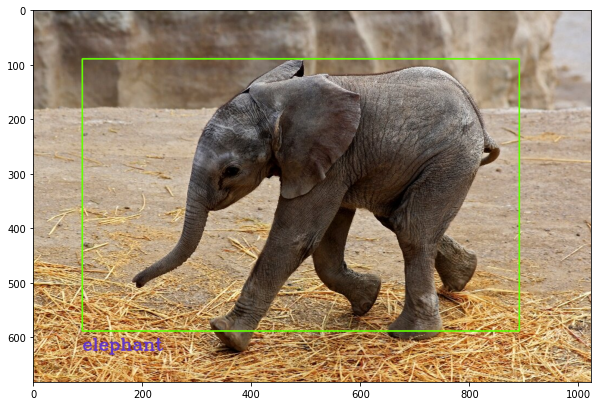

In [ ]:
!wget -q -O  elephant.jpg https://scx2.b-cdn.net/gfx/news/2020/zoomthebabye.jpg
image = cv2.imread('/content/elephant.jpg' )
predict(image, scale = 1)

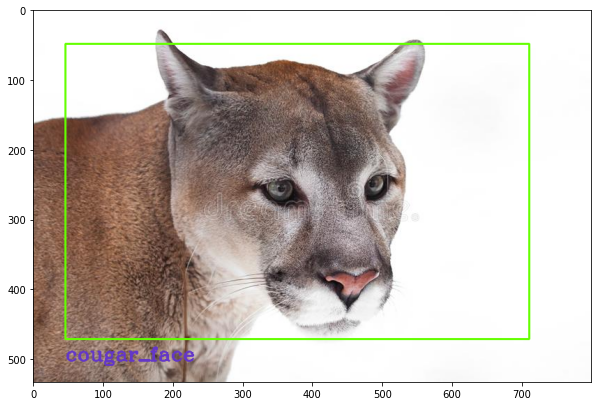

In [ ]:
!wget -q -O  cougar.jpg https://thumbs.dreamstime.com/b/muzzle-cougar-close-up-white-background-powerful-predatory-face-big-cat-puma-138114621.jpg
image = cv2.imread('/content/cougar.jpg' )
predict(image)

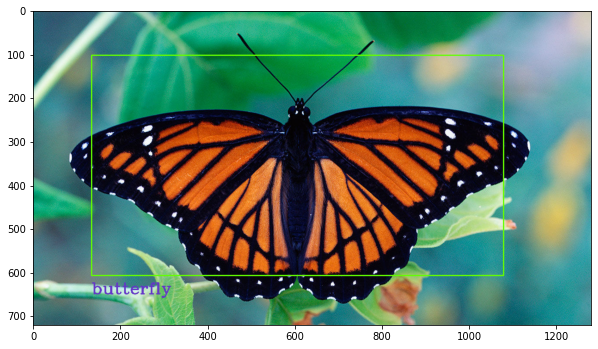

In [ ]:
!wget -q -O  butterfly.jpg https://www.sciencemag.org/sites/default/files/styles/article_main_large/public/butterfly_16x9_0.jpg?itok=jZ3DYvGK
image = cv2.imread('/content/butterfly.jpg' )
predict(image,scale=1.2)

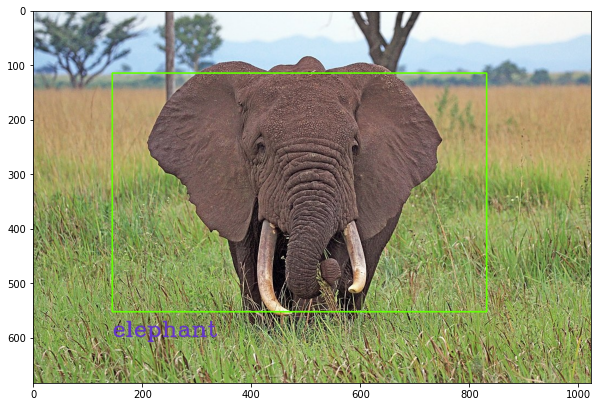

In [ ]:
!wget -q -O  elephant2.jpg https://upload.wikimedia.org/wikipedia/commons/thumb/8/84/African_elephant_%28Loxodonta_africana%29_2.jpg/1024px-African_elephant_%28Loxodonta_africana%29_2.jpg
image = cv2.imread('/content/elephant2.jpg' )
predict(image,scale = 1.3)

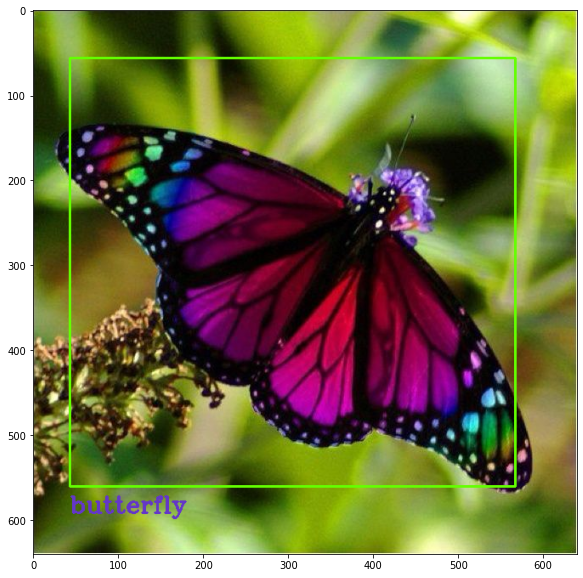

In [ ]:
!wget -q -O  butterfly2.jpg https://i.pinimg.com/originals/86/29/e8/8629e8d2b6658ef7954f56cfc51d764f.jpg
image = cv2.imread('/content/butterfly2.jpg' )
predict(image)

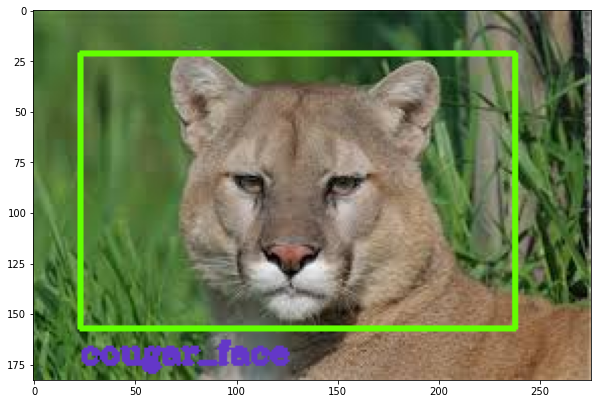

In [ ]:
!wget -q -O  cougar2.jpg https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcSmaFMOMQ5CLm2LNBKxsNmOeRHRjmew9Qhvwg&usqp=CAU
image = cv2.imread('/content/cougar2.jpg' )
predict(image, scale = 0.5)

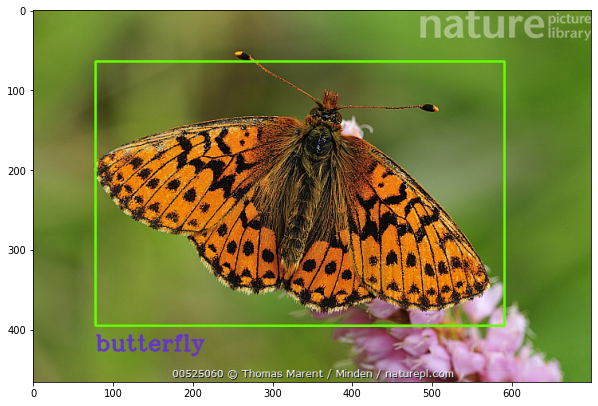

In [ ]:
!wget -q -O  butterfly3.jpg https://www.naturepl.com/cache/pcache2/00525060.jpg
image = cv2.imread('/content/butterfly3.jpg' )
predict(image)